# All imports (taken from https://colab.research.google.com/github/google-deepmind/mujoco/blob/main/python/tutorial.ipynb)

In [4]:
!pip install mujoco

# Set up GPU rendering.
from google.colab import files
import distutils.util
import os
import subprocess
if subprocess.run('nvidia-smi').returncode:
  raise RuntimeError(
      'Cannot communicate with GPU. '
      'Make sure you are using a GPU Colab runtime. '
      'Go to the Runtime menu and select Choose runtime type.')

# Add an ICD config so that glvnd can pick up the Nvidia EGL driver.
# This is usually installed as part of an Nvidia driver package, but the Colab
# kernel doesn't install its driver via APT, and as a result the ICD is missing.
# (https://github.com/NVIDIA/libglvnd/blob/master/src/EGL/icd_enumeration.md)
NVIDIA_ICD_CONFIG_PATH = '/usr/share/glvnd/egl_vendor.d/10_nvidia.json'
if not os.path.exists(NVIDIA_ICD_CONFIG_PATH):
  with open(NVIDIA_ICD_CONFIG_PATH, 'w') as f:
    f.write("""{
    "file_format_version" : "1.0.0",
    "ICD" : {
        "library_path" : "libEGL_nvidia.so.0"
    }
}
""")

# Configure MuJoCo to use the EGL rendering backend (requires GPU)
print('Setting environment variable to use GPU rendering:')
%env MUJOCO_GL=egl

# Check if installation was succesful.
try:
  print('Checking that the installation succeeded:')
  import mujoco
  mujoco.MjModel.from_xml_string('<mujoco/>')
except Exception as e:
  raise e from RuntimeError(
      'Something went wrong during installation. Check the shell output above '
      'for more information.\n'
      'If using a hosted Colab runtime, make sure you enable GPU acceleration '
      'by going to the Runtime menu and selecting "Choose runtime type".')

print('Installation successful.')

# Other imports and helper functions
import time
import itertools
import numpy as np

# Graphics and plotting.
print('Installing mediapy:')
!command -v ffmpeg >/dev/null || (apt update && apt install -y ffmpeg)
!pip install -q mediapy
import mediapy as media
import matplotlib.pyplot as plt

# More legible printing from numpy.
np.set_printoptions(precision=3, suppress=True, linewidth=100)

from IPython.display import clear_output
clear_output()


# MuJoCo basics

taking my xml file from previous step (see work log)

In [8]:
!ls

asset  bunny.xml  sample_data  scene.xml


In [9]:
model = mujoco.MjModel.from_xml_path("bunny.xml")

In [12]:
model.ngeom # geom is a basic collision/visual element in MuJoCo

20

In [13]:
try:
  model.geom()
except KeyError as e:
  print(e)

"Invalid name ''. Valid names: ['butt', 'foot1_left', 'foot1_right', 'foot2_left', 'foot2_right', 'ground', 'hand_left', 'hand_right', 'head', 'lower_arm_left', 'lower_arm_right', 'shin_left', 'shin_right', 'thigh_left', 'thigh_right', 'torso', 'upper_arm_left', 'upper_arm_right', 'waist_lower', 'waist_upper']"


In [14]:
model.geom('butt')

<_MjModelGeomViews
  bodyid: array([12], dtype=int32)
  conaffinity: array([1], dtype=int32)
  condim: array([1], dtype=int32)
  contype: array([1], dtype=int32)
  dataid: array([-1], dtype=int32)
  friction: array([0.7  , 0.005, 0.   ])
  gap: array([0.])
  group: array([1], dtype=int32)
  id: 5
  margin: array([0.])
  matid: array([1], dtype=int32)
  name: 'butt'
  pos: array([-0.02,  0.  ,  0.  ])
  priority: array([0], dtype=int32)
  quat: array([ 0.707,  0.707,  0.   , -0.   ])
  rbound: array([0.16])
  rgba: array([0.5, 0.5, 0.5, 1. ], dtype=float32)
  sameframe: array([2], dtype=uint8)
  size: array([0.09, 0.07, 0.  ])
  solimp: array([0.9  , 0.99 , 0.003, 0.5  , 2.   ])
  solmix: array([1.])
  solref: array([0.015, 1.   ])
  type: array([3], dtype=int32)
  user: array([], dtype=float64)
>

In [15]:
model.geom('butt').rgba

array([0.5, 0.5, 0.5, 1. ], dtype=float32)

In [17]:
[model.geom(i).name for i in range(model.ngeom)]

['ground',
 'torso',
 'waist_upper',
 'head',
 'waist_lower',
 'butt',
 'thigh_right',
 'shin_right',
 'foot1_right',
 'foot2_right',
 'thigh_left',
 'shin_left',
 'foot1_left',
 'foot2_left',
 'upper_arm_right',
 'lower_arm_right',
 'hand_right',
 'upper_arm_left',
 'lower_arm_left',
 'hand_left']

## `mjData`
`mjData` contains the *state* and quantities that depend on it. The state is made up of time, [generalized](https://en.wikipedia.org/wiki/Generalized_coordinates) positions and generalized velocities. These are respectively `data.time`, `data.qpos` and `data.qvel`. In order to make a new `mjData`, all we need is our `mjModel`

In [18]:
data = mujoco.MjData(model)

In [21]:
mujoco.mj_kinematics(model, data)
print('raw access:\n', data.geom_xpos)

# MjData also supports named access:
print('\nnamed access:\n', data.geom('butt').xpos)

raw access:
 [[ 0.     0.     0.   ]
 [ 0.5    0.     1.282]
 [ 0.49   0.     1.162]
 [ 0.5    0.     1.472]
 [ 0.49   0.     1.022]
 [ 0.47   0.     0.857]
 [ 0.49  -0.095  0.647]
 [ 0.49  -0.09   0.267]
 [ 0.525 -0.11   0.027]
 [ 0.525 -0.07   0.027]
 [ 0.49   0.095  0.647]
 [ 0.49   0.09   0.267]
 [ 0.525  0.07   0.027]
 [ 0.525  0.11   0.027]
 [ 0.58  -0.25   1.262]
 [ 0.77  -0.26   1.252]
 [ 0.86  -0.17   1.342]
 [ 0.58   0.25   1.262]
 [ 0.77   0.26   1.252]
 [ 0.86   0.17   1.342]]

named access:
 [0.47  0.    0.857]


# Basic rendering, simulation, and animation

In order to render we'll need to instantiate a `Renderer` object and call its `render` method.

We'll also reload our model to make the colab's sections independent.

""

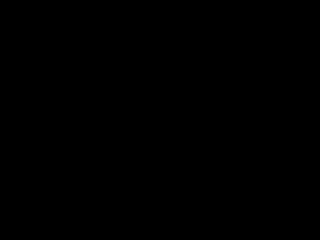

In [23]:
# Make renderer, render and show the pixels
with mujoco.Renderer(model) as renderer:
  media.show_image(renderer.render())

Hmmm, why the black pixels?

**Answer:** For the same reason as above, we first need to propagate the values in `mjData`. This time we'll call [`mj_forward`](https://mujoco.readthedocs.io/en/latest/APIreference/APIfunctions.html#mj-forward), which invokes the entire pipeline up to the computation of accelerations i.e., it computes $\dot x = f(x)$, where $x$ is the state. This function does more than we actually need, but unless we care about saving computation time, it's good practice to call `mj_forward` since then we know we are not missing anything.

We also need to update the `mjvScene` which is an object held by the renderer describing the visual scene. We'll later see that the scene can include visual objects which are not part of the physical model.

""

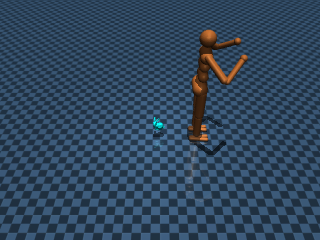

In [24]:
with mujoco.Renderer(model) as renderer:
  mujoco.mj_forward(model, data)
  renderer.update_scene(data)

  media.show_image(renderer.render())

In [25]:
# added <light name="top" pos="0 0 1"/> to bunny.xml --> bunny_light.xml

""

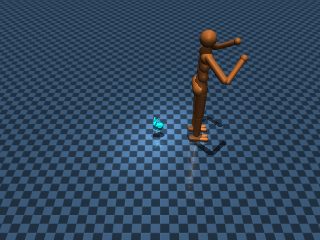

In [4]:
model = mujoco.MjModel.from_xml_path("bunny_light.xml")
data = mujoco.MjData(model)

with mujoco.Renderer(model) as renderer:
  mujoco.mj_forward(model, data)
  renderer.update_scene(data)

  media.show_image(renderer.render())

Much better!

Note that all values in the `mjModel` instance are writable. While it's generally not recommended to do this but rather to change the values in the XML, because it's easy to make an invalid model, some values are safe to write into, for example colors:

""

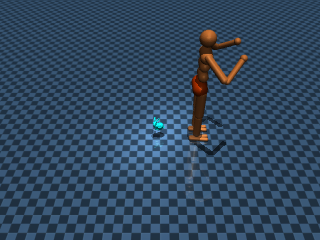

In [32]:
# Run this cell multiple times for different colors
model.geom('butt').rgba[:3] = np.random.rand(3)
with mujoco.Renderer(model) as renderer:
  renderer.update_scene(data)

  media.show_image(renderer.render())

# Simulation

Now let's simulate and make a video. We'll use MuJoCo's main high level function `mj_step`, which steps the state $x_{t+h} = f(x_t)$.

Note that in the code block below we are *not* rendering after each call to `mj_step`. This is because the default timestep is 2ms, and we want a 60fps video, not 500fps.

In [33]:
duration = 3.8  # (seconds)
framerate = 60  # (Hz)

# Simulate and display video.
frames = []
mujoco.mj_resetData(model, data)  # Reset state and time.
with mujoco.Renderer(model) as renderer:
  while data.time < duration:
    mujoco.mj_step(model, data)
    if len(frames) < data.time * framerate:
      renderer.update_scene(data)
      pixels = renderer.render()
      frames.append(pixels)

media.show_video(frames, fps=framerate)

In [43]:
# enable joint visualization option & flip gravity!:
scene_option = mujoco.MjvOption()
scene_option.flags[mujoco.mjtVisFlag.mjVIS_JOINT] = True

duration = 3.8  # (seconds)
framerate = 60  # (Hz)
model.opt.gravity[:] = [0, 0, -9.81] # this is default
model.opt.gravity[:] = [0, 0, 10] # flipped gravity!

# Simulate and display video.
frames = []
mujoco.mj_resetData(model, data)
with mujoco.Renderer(model) as renderer:
  while data.time < duration:
    mujoco.mj_step(model, data)
    if len(frames) < data.time * framerate:
      renderer.update_scene(data, scene_option=scene_option)
      pixels = renderer.render()
      frames.append(pixels)

media.show_video(frames, fps=framerate)

In [38]:
model.opt.timestep

0.001

We could also have done this in XML using the top-level `<option>` element:
```xml
<mujoco>
  <option gravity="0 0 10"/>
  ...
</mujoco>
```

### Understanding Degrees of Freedom

In the real world, all rigid objects have 6 degrees-of-freedom: 3 translations and 3 rotations. Real-world joints act as constraints, removing relative degrees-of-freedom from bodies connected by joints. Some physics simulation software use this representation which is known as the "Cartesian" or "subtractive" representation, but it is inefficient. MuJoCo uses a representation known as the "Lagrangian", "generalized" or "additive" representation, whereby objects have no degrees of freedom unless explicitly added using joints.

Our model, which has a single hinge joint, has one degree of freedom, and the entire state is defined by this joint's angle and angular velocity. These are the system's generalized position and velocity.

In [44]:
print('Total number of DoFs in the model:', model.nv)
print('Generalized positions:', data.qpos)
print('Generalized velocities:', data.qvel)

Total number of DoFs in the model: 51
Generalized positions: [ 0.     0.    72.257  0.     0.    72.257  0.     0.    72.257  0.     0.    72.257  0.     0.
 72.257  0.     0.    72.257  0.     0.    72.257  0.     0.    72.257  0.5   -0.    73.539  1.
  0.     0.     0.     0.    -0.    -0.     0.     0.    -0.     0.    -0.    -0.     0.    -0.
  0.     0.    -0.    -0.    -0.     0.     0.    -0.     0.     0.   ]
Generalized velocities: [ 0.    0.   38.01  0.    0.   38.01  0.    0.   38.01  0.    0.   38.01  0.    0.   38.01  0.
  0.   38.01  0.   -0.   38.01  0.   -0.   38.01  0.   -0.   38.01  0.   -0.   -0.    0.    0.
  0.    0.    0.   -0.    0.    0.   -0.   -0.   -0.    0.    0.    0.   -0.    0.    0.    0.
 -0.   -0.    0.  ]


MuJoCo's use of generalized coordinates is the reason that calling a function (e.g. [`mj_forward`](https://mujoco.readthedocs.io/en/latest/APIreference.html#mj-forward)) is required before rendering or reading the global poses of objects – Cartesian positions are *derived* from the generalized positions and need to be explicitly computed.

In [53]:
model = mujoco.MjModel.from_xml_path("bunny_light.xml")
data = mujoco.MjData(model)
model.opt.gravity[:] = [0, 0, -9.81]
duration = 7    # (seconds)
framerate = 60  # (Hz)

# Simulate and display video.
frames = []
mujoco.mj_resetDataKeyframe(model, data, 0)  # Reset the state to keyframe 0
with mujoco.Renderer(model) as renderer:
  while data.time < duration:
    mujoco.mj_step(model, data)
    if len(frames) < data.time * framerate:
      renderer.update_scene(data, "back")
      pixels = renderer.render()
      frames.append(pixels)

media.show_video(frames, fps=framerate)

""

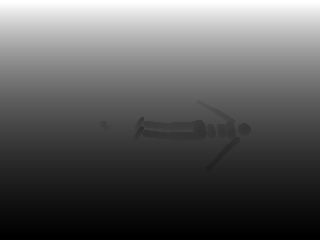

In [66]:
#@title Depth rendering {vertical-output: true}

with mujoco.Renderer(model) as renderer:
  # update renderer to render depth
  renderer.enable_depth_rendering()

  # reset the scene
  renderer.update_scene(data)

  # depth is a float array, in meters.
  depth = renderer.render()

  d = depth.copy()
  near, far = np.percentile(d, [1, 99])
  pixels = 255 * np.clip((d - near) / (far - near), 0, 1)
  media.show_image(pixels.astype(np.uint8))

""

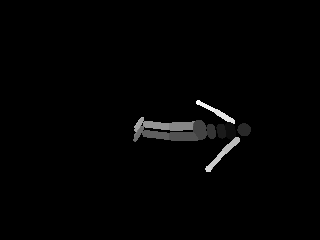

In [65]:
#@title Segmentation rendering {vertical-output: true}

with mujoco.Renderer(model) as renderer:
  renderer.disable_depth_rendering()

  # update renderer to render segmentation
  renderer.enable_segmentation_rendering()

  # reset the scene
  renderer.update_scene(data)

  seg = renderer.render()

  # Display the contents of the first channel, which contains object
  # IDs. The second channel, seg[:, :, 1], contains object types.
  geom_ids = seg[:, :, 0]
  # Infinity is mapped to -1
  geom_ids = geom_ids.astype(np.float64) + 1
  # Scale to [0, 1]
  geom_ids = geom_ids / geom_ids.max()
  pixels = 255*geom_ids
  media.show_image(pixels.astype(np.uint8))

## The camera matrix

For a description of the camera matrix see the article [Camera matrix](https://en.wikipedia.org/wiki/Camera_matrix) on Wikipedia.

In [68]:
def compute_camera_matrix(renderer, data):
  """Returns the 3x4 camera matrix."""
  # If the camera is a 'free' camera, we get its position and orientation
  # from the scene data structure. It is a stereo camera, so we average over
  # the left and right channels. Note: we call `self.update()` in order to
  # ensure that the contents of `scene.camera` are correct.
  renderer.update_scene(data)
  pos = np.mean([camera.pos for camera in renderer.scene.camera], axis=0)
  z = -np.mean([camera.forward for camera in renderer.scene.camera], axis=0)
  y = np.mean([camera.up for camera in renderer.scene.camera], axis=0)
  rot = np.vstack((np.cross(y, z), y, z))
  fov = model.vis.global_.fovy

  # Translation matrix (4x4).
  translation = np.eye(4)
  translation[0:3, 3] = -pos

  # Rotation matrix (4x4).
  rotation = np.eye(4)
  rotation[0:3, 0:3] = rot

  # Focal transformation matrix (3x4).
  focal_scaling = (1./np.tan(np.deg2rad(fov)/2)) * renderer.height / 2.0
  focal = np.diag([-focal_scaling, focal_scaling, 1.0, 0])[0:3, :]

  # Image matrix (3x3).
  image = np.eye(3)
  image[0, 2] = (renderer.width - 1) / 2.0
  image[1, 2] = (renderer.height - 1) / 2.0
  return image @ focal @ rotation @ translation

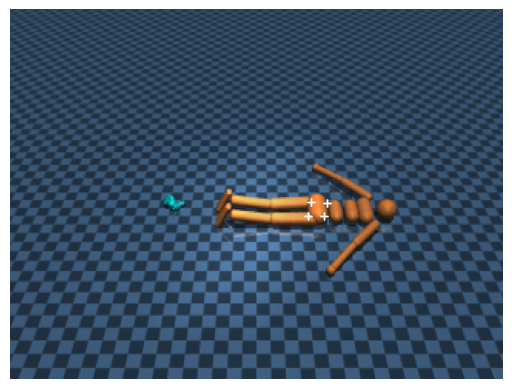

In [69]:
#@title Project from world to camera coordinates {vertical-output: true}

with mujoco.Renderer(model) as renderer:
  renderer.disable_segmentation_rendering()
  # reset the scene
  renderer.update_scene(data)

  # Get the world coordinates of the box corners
  box_pos = data.geom_xpos[model.geom('butt').id]
  box_mat = data.geom_xmat[model.geom('butt').id].reshape(3, 3)
  box_size = model.geom_size[model.geom('butt').id]
  offsets = np.array([-1, 1]) * box_size[:, None]
  xyz_local = np.stack(list(itertools.product(*offsets))).T
  xyz_global = box_pos[:, None] + box_mat @ xyz_local

  # Camera matrices multiply homogenous [x, y, z, 1] vectors.
  corners_homogeneous = np.ones((4, xyz_global.shape[1]), dtype=float)
  corners_homogeneous[:3, :] = xyz_global

  # Get the camera matrix.
  m = compute_camera_matrix(renderer, data)

  # Project world coordinates into pixel space. See:
  # https://en.wikipedia.org/wiki/3D_projection#Mathematical_formula
  xs, ys, s = m @ corners_homogeneous
  # x and y are in the pixel coordinate system.
  x = xs / s
  y = ys / s

  # Render the camera view and overlay the projected corner coordinates.
  pixels = renderer.render()
  fig, ax = plt.subplots(1, 1)
  ax.imshow(pixels)
  ax.plot(x, y, '+', c='w')
  ax.set_axis_off()

## Depth - RGB Point Cloud

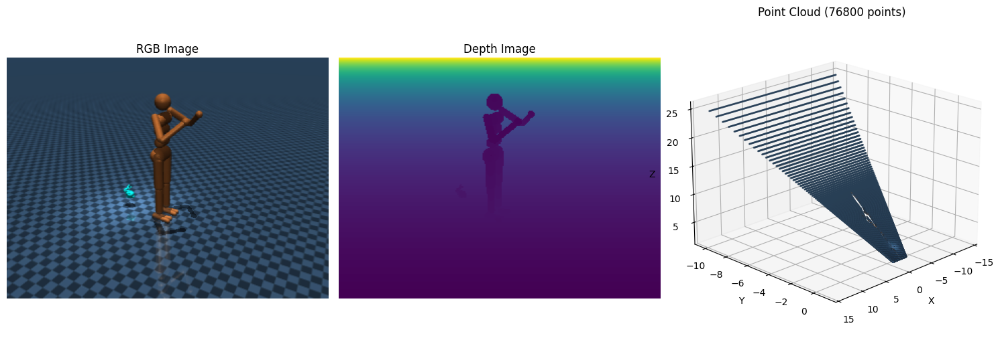

Generated point cloud with 76800 points


In [5]:
#@title Depth Cloud {vertical-output: true}
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

camera_id = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_CAMERA, "back")

# Render RGB and Depth
with mujoco.Renderer(model) as renderer:
    # render RGB
    renderer.update_scene(data, camera=camera_id)
    rgb = renderer.render()

    # render depth ; https://github.com/google-deepmind/mujoco/blob/main/python/mujoco/renderer.py#L182
    renderer.enable_depth_rendering()
    renderer.update_scene(data, camera=camera_id)
    depth = renderer.render()

# https://simulately.wiki/docs/snippets/mujoco/camera/#depth-rendering
# Get camera intrinsics
height, width = depth.shape
fovy = model.cam_fovy[camera_id]  # Field of view in degrees
f = height / (2 * np.tan(np.radians(fovy) / 2))  # Focal length in pixels
cx, cy = width / 2, height / 2  # Principal point

# Create pixel coordinate grids
u = np.arange(width)
v = np.arange(height)
u, v = np.meshgrid(u, v)

# Convert depth to 3D points in camera coordinates
z = depth
x = (u - cx) * z / f
y = (v - cy) * z / f

# Reshape to point cloud
points = np.stack([x, y, z], axis=-1).reshape(-1, 3)
colors = rgb.reshape(-1, 3) / 255.0

# Visualize
fig = plt.figure(figsize=(15, 5))

# RGB
ax1 = fig.add_subplot(131)
ax1.imshow(rgb)
ax1.set_title('RGB Image')
ax1.axis('off')

# Depth
ax2 = fig.add_subplot(132)
ax2.imshow(depth, cmap='viridis')
ax2.set_title('Depth Image')
ax2.axis('off')

# Point Cloud (downsample for faster visualization)
ax3 = fig.add_subplot(133, projection='3d')
step = max(1, len(points) // 50000)  # Show max 50k points
ax3.scatter(points[::step, 0], points[::step, 1], points[::step, 2],
           c=colors[::step], s=1, alpha=0.5)
ax3.set_xlabel('X')
ax3.set_ylabel('Y')
ax3.set_zlabel('Z')
ax3.set_title(f'Point Cloud ({len(points)} points)')
ax3.view_init(elev=20, azim=45)

plt.tight_layout()
plt.show()

print(f"Generated point cloud with {len(points)} points")

In [9]:
import open3d as o3d

# Open3D Conversion
pcd = o3d.geometry.PointCloud()
pcd.points = o3d.utility.Vector3dVector(points)
pcd.colors = o3d.utility.Vector3dVector(colors)

# better vis by estimating normals
pcd.estimate_normals(search_param=o3d.geometry.KDTreeSearchParamHybrid(radius=0.1, max_nn=30)) # tried diff hyperparams

visualizer = o3d.visualization.draw_plotly([pcd])

# Misc testing

In [11]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [17]:
model = mujoco.MjModel.from_xml_path("/content/drive/MyDrive/Stanford/Applications/IPRL/cube/cube_3x3x3.xml")
data = mujoco.MjData(model)

In [23]:
model.camera('main')

<_MjModelCameraViews
  bodyid: array([0], dtype=int32)
  fovy: array([45.])
  id: 0
  ipd: array([0.068])
  mat0: array([ 0.653, -0.452,  0.608,  0.758,  0.39 , -0.524,  0.   ,  0.802,  0.597])
  mode: array([0], dtype=int32)
  name: 'main'
  pos: array([ 0.174, -0.15 ,  0.171])
  pos0: array([ 0.174, -0.15 ,  0.171])
  poscom0: array([ 0.174, -0.15 ,  0.171])
  quat: array([0.812, 0.408, 0.187, 0.372])
  targetbodyid: array([-1], dtype=int32)
  user: array([], dtype=float64)
>

In [30]:
camera_id = mujoco.mj_name2id(model, mujoco.mjtObj.mjOBJ_CAMERA, 'main')
print(f'camera_id: {camera_id} and type: {type(camera_id)}')
model.cam_fovy[camera_id]

camera_id: 0 and type: <class 'int'>


np.float64(45.0)

""

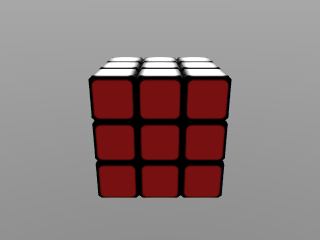

In [31]:
with mujoco.Renderer(model) as renderer:
  mujoco.mj_forward(model, data)
  renderer.update_scene(data)

  media.show_image(renderer.render())

""

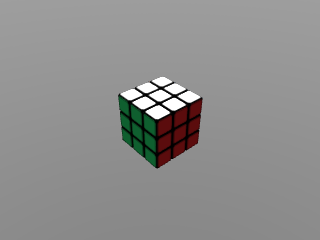

In [33]:
with mujoco.Renderer(model) as renderer:
  mujoco.mj_forward(model, data)
  renderer.update_scene(data, camera=camera_id)

  media.show_image(renderer.render())

""

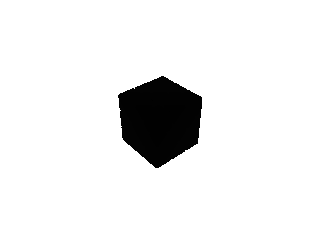

depth: min-max 0.21822509169578552-5.000170707702637  and shape (240, 320)


In [40]:
with mujoco.Renderer(model) as renderer:
  mujoco.mj_forward(model, data)
  renderer.enable_depth_rendering()
  renderer.update_scene(data, camera=camera_id)
  depth = renderer.render()

  media.show_image(depth)
print(f'depth: min-max {depth.min()}-{depth.max()}  and shape {depth.shape}')